In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.utils.prune as prune
import torchvision.models as models
from torch.onnx import export

import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

from torch.nn.utils import parameters_to_vector
from torch.optim.lr_scheduler import ReduceLROnPlateau

from torch.optim.lr_scheduler import CosineAnnealingLR

In [2]:
# onnxファイルを作成する関数
def model_to_onnx(model, output_file, input_shape = (1, 3, 224, 224)):
  model.eval()
  input_tensor = torch.randn(input_shape).to('cpu')
  input_names = ['input']
  output_names = ['output']
  torch.onnx.export(model, input_tensor, output_file, verbose = False, input_names = input_names, output_names = output_names)
  return output_file

In [40]:
# モデル読み込み
pt_model_path = "dense.pt"
model = models.resnet18()
model.fc = nn.Linear(model.fc.in_features, 10)  # CIFAR-10 にあわせて出力層変更
model.load_state_dict(torch.load(pt_model_path))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [41]:
# 訓練データセット作成
transform = transforms.Compose([transforms.Resize(224),
                                transforms.ToTensor(),
                                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])   # 正規化したほうがいいらしい

trainset = torchvision.datasets.CIFAR10(root = "./data", train = True, download = True, transform = transform)
trainloader = DataLoader(trainset, batch_size = 400, shuffle = True)

In [5]:
# 2. モデルの全てのモジュールを名前付きでループ
for name, module in model.named_modules():

    # 3. モジュールが畳み込み層(nn.Conv2d)かどうかを判定
    if isinstance(module, nn.Conv2d):

        print(f"レイヤー名: '{name}'")
        print(f"  - 重みの形状 (4階テンソル): {module.weight.shape}")
        print(f"  - 重みのサイズ: {module.weight.numel()}")

レイヤー名: 'conv1'
  - 重みの形状 (4階テンソル): torch.Size([64, 3, 7, 7])
  - 重みのサイズ: 9408
レイヤー名: 'layer1.0.conv1'
  - 重みの形状 (4階テンソル): torch.Size([64, 64, 3, 3])
  - 重みのサイズ: 36864
レイヤー名: 'layer1.0.conv2'
  - 重みの形状 (4階テンソル): torch.Size([64, 64, 3, 3])
  - 重みのサイズ: 36864
レイヤー名: 'layer1.1.conv1'
  - 重みの形状 (4階テンソル): torch.Size([64, 64, 3, 3])
  - 重みのサイズ: 36864
レイヤー名: 'layer1.1.conv2'
  - 重みの形状 (4階テンソル): torch.Size([64, 64, 3, 3])
  - 重みのサイズ: 36864
レイヤー名: 'layer2.0.conv1'
  - 重みの形状 (4階テンソル): torch.Size([128, 64, 3, 3])
  - 重みのサイズ: 73728
レイヤー名: 'layer2.0.conv2'
  - 重みの形状 (4階テンソル): torch.Size([128, 128, 3, 3])
  - 重みのサイズ: 147456
レイヤー名: 'layer2.0.downsample.0'
  - 重みの形状 (4階テンソル): torch.Size([128, 64, 1, 1])
  - 重みのサイズ: 8192
レイヤー名: 'layer2.1.conv1'
  - 重みの形状 (4階テンソル): torch.Size([128, 128, 3, 3])
  - 重みのサイズ: 147456
レイヤー名: 'layer2.1.conv2'
  - 重みの形状 (4階テンソル): torch.Size([128, 128, 3, 3])
  - 重みのサイズ: 147456
レイヤー名: 'layer3.0.conv1'
  - 重みの形状 (4階テンソル): torch.Size([256, 128, 3, 3])
  - 重みのサイズ: 294912
レイヤー名: 'laye

In [6]:
# モデルの重みを見る
with torch.no_grad():
    weights = model.conv1.weight
    print(f"レイヤー: resnet18.conv1")
    print(f"  重みの平均: {weights.mean().item():.6f}, 分散: {weights.var().item():.6f}\n")

    weights = model.layer1[0].conv2.weight
    print(f"レイヤー: resnet18.layer1[0].conv2")
    print(f"  重みの平均: {weights.mean().item():.6f}, 分散: {weights.var().item():.6f}\n")

    weights = model.layer4[1].conv2.weight
    print(f"レイヤー: resnet18.layer4[1].conv2")
    print(f"  重みの平均: {weights.mean().item():.6f}, 分散: {weights.var().item():.6f}\n")
    


レイヤー: resnet18.conv1
  重みの平均: -0.000179, 分散: 0.016822

レイヤー: resnet18.layer1[0].conv2
  重みの平均: -0.000911, 分散: 0.002046

レイヤー: resnet18.layer4[1].conv2
  重みの平均: -0.000043, 分散: 0.000176



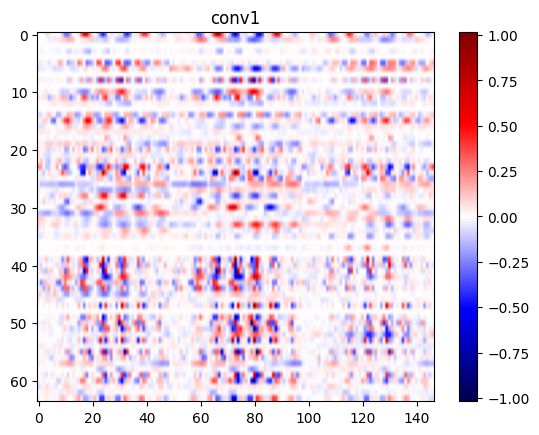

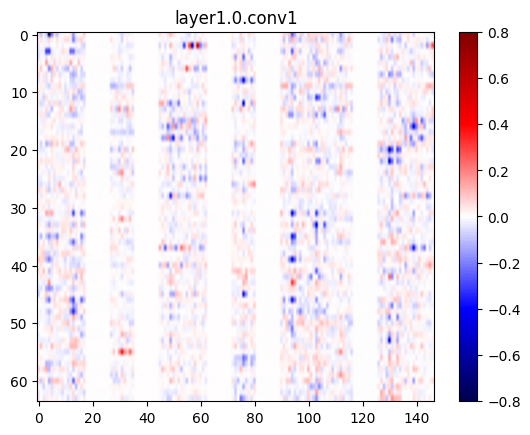

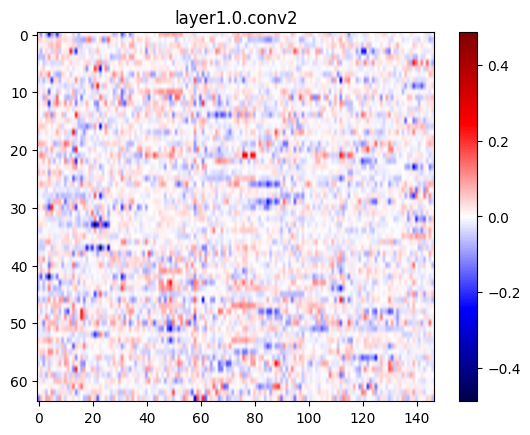

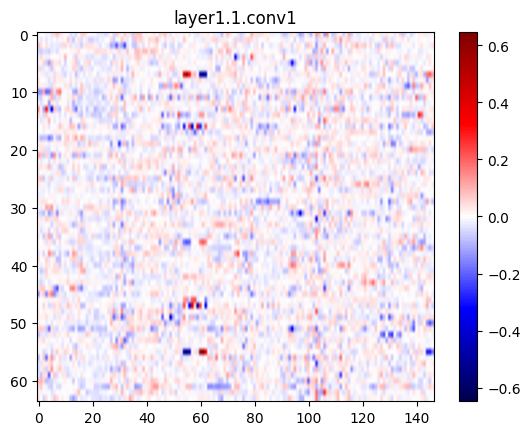

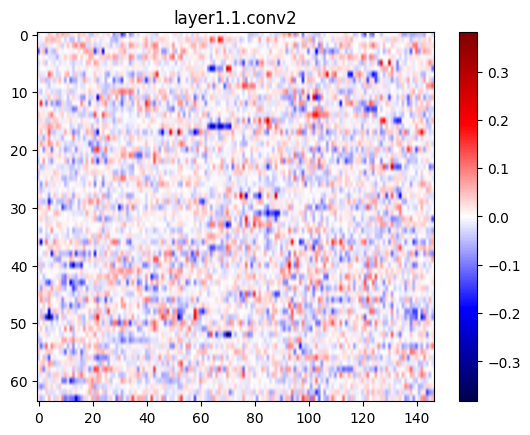

...

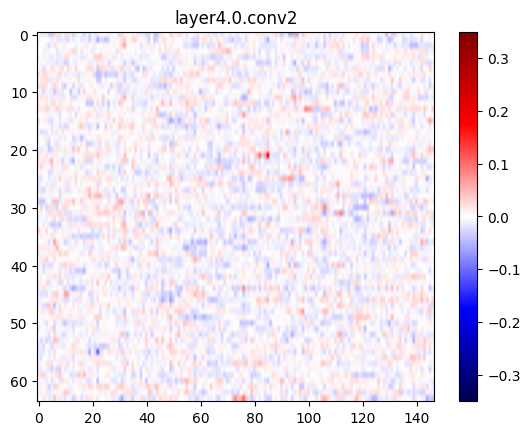

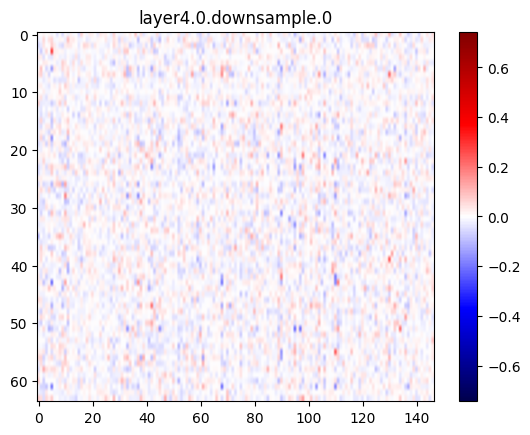

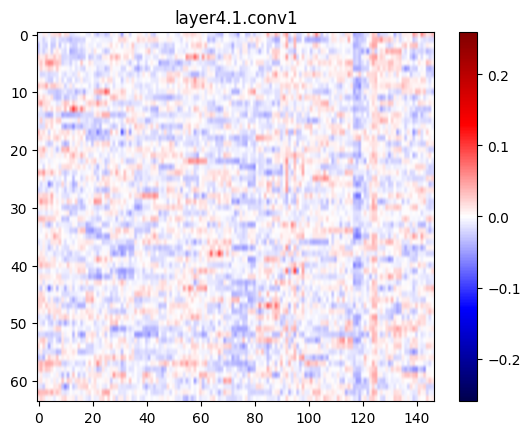

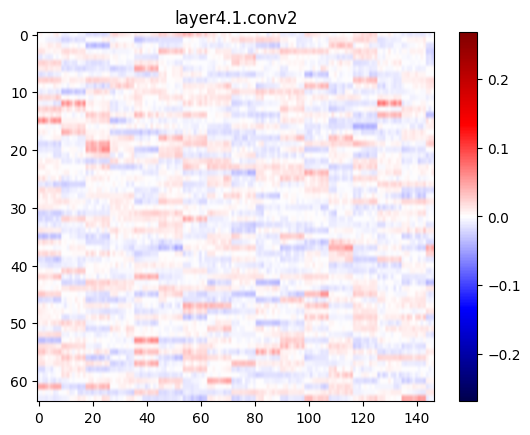

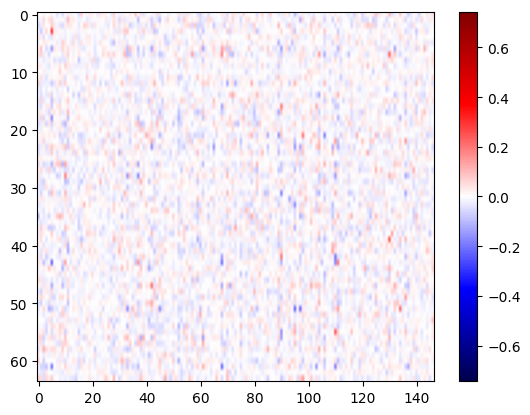

In [30]:
# 2. モデルの全てのモジュールを名前付きでループ
for name, module in model.named_modules():

    # 3. モジュールが畳み込み層(nn.Conv2d)かどうかを判定
    if isinstance(module, nn.Conv2d):
        conv_weight = module.weight.data
        w_2d = conv_weight.view(conv_weight.size(0), -1).numpy()  # shape: [64, 3×7×7=147]

        # データの絶対値の最大値を取得
        vmax = np.abs(w_2d).max()
        plt.imshow(w_2d[:64, :147], cmap='seismic', aspect='auto', vmin = -vmax, vmax = vmax)   #[:64, :147]にしてサイズを一致させてブロックスパースかどうかをみやすく
        plt.colorbar()
        plt.title(name)
        plt.show()

conv_weight = model.layer4[0].downsample[0].weight.data
w_2d = conv_weight.view(conv_weight.size(0), -1).numpy()  # shape: [64, 3×7×7=147]

# データの絶対値の最大値を取得
vmax = np.abs(w_2d).max()
plt.imshow(w_2d[:64, :147], cmap='seismic', aspect='auto', vmin = -vmax, vmax = vmax)
plt.colorbar()
plt.show()

In [31]:
def Omega(delta):
    """
    4階テンソルdeltaの各次元に沿った差分を計算し、
    その絶対値の総和を返す。
    """
    h = 1.0  # Dのパラメータ

    # 4つの次元それぞれに対して差分（勾配）を計算

    # dim=0 (出力チャネル方向の差分)
    diff_dim0 = delta[1:, :, :, :] - delta[:-1, :, :, :]

    # dim=1 (入力チャネル方向の差分)
    diff_dim1 = delta[:, 1:, :, :] - delta[:, :-1, :, :]

    # dim=2 (縦方向の差分)
    # 1行目から最後までと、0行目から最後の一つ手前までの差
    diff_dim2 = delta[:, :, 1:, :] - delta[:, :, :-1, :]

    # dim=3 (横方向の差分)
    # 1列目から最後までと、0列目から最後の一つ手前までの差
    diff_dim3 = delta[:, :, :, 1:] - delta[:, :, :, :-1]

    # 全ての差分の絶対値の総和を計算
    # これがD@deltaに相当する操作のL1ノルムになる
    constrain = torch.sum(torch.abs(diff_dim0)) + torch.sum(torch.abs(diff_dim1)) + torch.sum(torch.abs(diff_dim2)) + torch.sum(torch.abs(diff_dim3))

    return constrain / h

In [32]:
def Ofunction(w_tensor, mu_tensor, delta_tensor, Lambda, alpha):
    # Lambda = 0.03
    # alpha = 0.5

    # (1) 二乗誤差の項
    term1 = torch.sum((w_tensor - mu_tensor * delta_tensor)**2) / 2

    # (2) L2ノルムの項
    term2 = Lambda / 2 * (torch.sum(mu_tensor**2) + torch.sum(delta_tensor**2))

    # (3) 制約項
    constrain = Omega(delta_tensor)

    return term1 + term2 + alpha * constrain

In [33]:
# 各層のTVを見てみる
layer_tvs = {}
conv_layer_names = []

for name, module in model.named_modules():
    if isinstance(module, nn.Conv2d):
        w_tensor = module.weight.detach().clone().to(device)
        tv = Omega(w_tensor).item()
        ave_tv = tv/(w_tensor).numel()
        relative_tv = tv / torch.sum(torch.abs(w_tensor)).item()
        layer_tvs[name] = relative_tv
        conv_layer_names.append(name)
        print(f"{name}：TV={tv:.4f}     ave_TV={ave_tv:.4f}     relative_TV={relative_tv:.4f}")
        

conv1：TV=2785.1948     ave_TV=0.2960     relative_TV=3.8864
layer1.0.conv1：TV=5368.6899     ave_TV=0.1456     relative_TV=4.6001
layer1.0.conv2：TV=5110.8359     ave_TV=0.1386     relative_TV=4.3279
layer1.1.conv1：TV=5665.4883     ave_TV=0.1537     relative_TV=4.4829
layer1.1.conv2：TV=5081.4331     ave_TV=0.1378     relative_TV=4.3692
layer2.0.conv1：TV=9606.8564     ave_TV=0.1303     relative_TV=4.4254
layer2.0.conv2：TV=15700.7480     ave_TV=0.1065     relative_TV=4.4383
layer2.0.downsample.0：TV=1077.2024     ave_TV=0.1315     relative_TV=2.9591
layer2.1.conv1：TV=16048.6338     ave_TV=0.1088     relative_TV=4.4778
layer2.1.conv2：TV=14007.5215     ave_TV=0.0950     relative_TV=4.2592
layer3.0.conv1：TV=24442.1191     ave_TV=0.0829     relative_TV=3.9467
layer3.0.conv2：TV=45506.3359     ave_TV=0.0772     relative_TV=4.1868
layer3.0.downsample.0：TV=2261.6729     ave_TV=0.0690     relative_TV=2.8949
layer3.1.conv1：TV=41485.1523     ave_TV=0.0703     relative_TV=4.2055
layer3.1.conv2：TV=37498

In [42]:
# relative_TVからalpha, lambdaの値を変える
alpha_min = 0
alpha_max = 1
lambda_min = 0.035
lambda_max = 0.07
max_tv = max(layer_tvs.values())
min_tv = min(layer_tvs.values())
tv_threshold = min(layer_tvs.values()) + (max(layer_tvs.values()) - min(layer_tvs.values())) / 2      # np.mean(list(layer_tvs.values()))
layer_alphas = {}
layer_lambdas = {}

for name in conv_layer_names:
    tv = layer_tvs[name]

    if tv >= tv_threshold:
        alpha = alpha_min
        Lambda = lambda_min
    
    else:
        scale = abs((tv - tv_threshold) / (min_tv  - tv_threshold))
        alpha = alpha_min + (alpha_max - alpha_min) * scale
        Lambda = lambda_min + (lambda_max - lambda_min) * (1 / (1 + np.exp(-50 * (scale - 0.5))))   #scale**3
        
    layer_alphas[name] = alpha
    layer_lambdas[name] = Lambda

layer_alphas, layer_lambdas

({'conv1': 0,
  'layer1.0.conv1': 0,
  'layer1.0.conv2': 0,
  'layer1.1.conv1': 0,
  'layer1.1.conv2': 0,
  'layer2.0.conv1': 0,
  'layer2.0.conv2': 0,
  'layer2.0.downsample.0': 0.9030735447473086,
  'layer2.1.conv1': 0,
  'layer2.1.conv2': 0,
  'layer3.0.conv1': 0,
  'layer3.0.conv2': 0,
  'layer3.0.downsample.0': 0.9775299792058947,
  'layer3.1.conv1': 0,
  'layer3.1.conv2': 0,
  'layer4.0.conv1': 0,
  'layer4.0.conv2': 0,
  'layer4.0.downsample.0': 1.0,
  'layer4.1.conv1': 0,
  'layer4.1.conv2': 0.4179138527089087},
 {'conv1': 0.035,
  'layer1.0.conv1': 0.035,
  'layer1.0.conv2': 0.035,
  'layer1.1.conv1': 0.035,
  'layer1.1.conv2': 0.035,
  'layer2.0.conv1': 0.035,
  'layer2.0.conv2': 0.035,
  'layer2.0.downsample.0': 0.06999999993813612,
  'layer2.1.conv1': 0.035,
  'layer2.1.conv2': 0.035,
  'layer3.0.conv1': 0.035,
  'layer3.0.conv2': 0.035,
  'layer3.0.downsample.0': 0.06999999999850502,
  'layer3.1.conv1': 0.035,
  'layer3.1.conv2': 0.035,
  'layer4.0.conv1': 0.035,
  'layer4

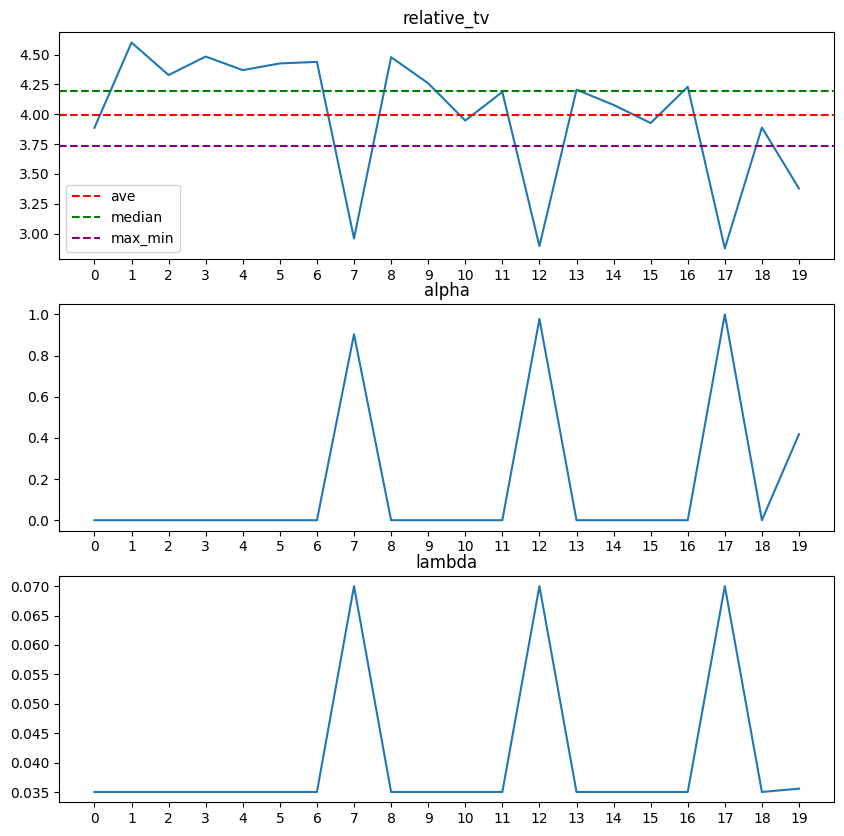

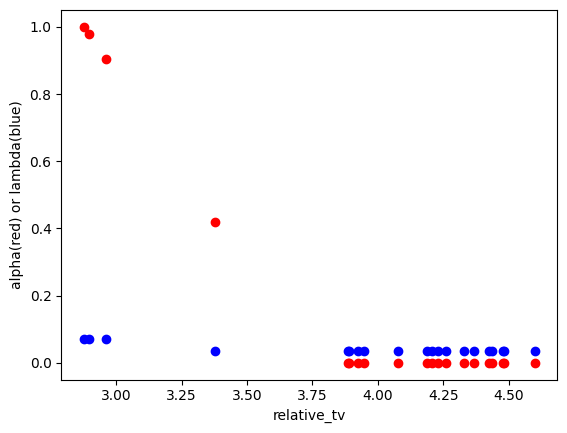

In [35]:
ave_tv = np.mean(list(layer_tvs.values()))
mid_tv = np.median(list(layer_tvs.values()))
max_min = min(layer_tvs.values()) + (max(layer_tvs.values()) - min(layer_tvs.values())) / 2

fig, ax = plt.subplots(3, figsize=(10,10))
ax[0].plot(layer_tvs.values())
ax[0].set_xticks(range(20))
ax[0].set_title('relative_tv')
ax[0].axhline(y=ave_tv, color='red', linestyle='--', label='ave')
ax[0].axhline(y=mid_tv, color='green', linestyle='--', label='median')
ax[0].axhline(y=max_min, color='purple', linestyle='--', label='max_min')
ax[0].legend()
ax[1].plot(layer_alphas.values())
ax[1].set_xticks(range(20))
ax[1].set_title('alpha')
ax[2].plot(layer_lambdas.values())
ax[2].set_xticks(range(20))
ax[2].set_title('lambda')
plt.show()

plt.scatter(layer_tvs.values(), layer_alphas.values(), color = 'red')
plt.scatter(layer_tvs.values(), layer_lambdas.values(), color = 'blue')
plt.xlabel('relative_tv')
plt.ylabel('alpha(red) or lambda(blue)')
plt.show()

##赤線の平均より上は全部alpha=0, Lambda=0.3とする

In [43]:
# 畳み込み層のモジュールだけをループ
final_weights_to_assign = {}
loss_list = {}
for name, module in model.named_modules():
    if isinstance(module, nn.Conv2d):
        print(f"--- レイヤー '{name}' の処理を開始 ---")

        # wを4階テンソルのまま取得
        # .detach().clone()で勾配情報を切り離し、安全なコピーを作成
        w_tensor = module.weight.detach().clone().to(device)

        # w_tensorの絶対値の平方根を計算
        w_abs_sqrt = torch.sqrt(torch.abs(w_tensor))

        # w_tensorの符号を取得 (-1, 0, 1)
        w_sign = torch.sign(w_tensor)

        # mu と delta を初期化
        mu_init = w_abs_sqrt.clone().to(device)
        delta_init = w_abs_sqrt.clone().to(device) # clone()でコピーを作成

        # muとdeltaもwと同じ4階テンソルの形状で初期化
        mu_tensor = torch.nn.Parameter(mu_init)
        delta_tensor = torch.nn.Parameter(delta_init)

        # オプティマイザの定義
        optimizer = torch.optim.Adam([mu_tensor, delta_tensor], lr = 0.1)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.7, patience=100)
        lr_threshold = 5e-8
        loss_list[name] = []

        # 学習ループ
        for step in range(20000):
            optimizer.zero_grad()

            # 4階テンソルのまま関数に渡す
            loss = Ofunction(torch.abs(w_tensor), mu_tensor, delta_tensor, layer_lambdas[name], layer_alphas[name])
            loss.backward()
            optimizer.step()
            scheduler.step(loss)

            if step % 100 == 0:
                print(f"Step {step}: Loss = {loss.item():4f}, LR: {optimizer.param_groups[0]['lr']:.9f}")
                loss_list[name].append(loss.item())
                if step >= 100:
                    if np.abs(loss_list[name][int(step/100)]-loss_list[name][int(step/100) - 1]) < 1e-4:
                        print(f"損失の差{np.abs(loss_list[name][int(step/100)]-loss_list[name][int(step/100)-1])}が1e-4を下回ったため、学習を終了します。")
                        break
            
            current_lr = optimizer.param_groups[0]['lr']   # 今の学習率を取り出す
            
            if current_lr < lr_threshold:
                print(f"学習率 ({current_lr:.9f}) が閾値 ({lr_threshold}) を下回ったため、学習を終了します。")
                break
            
        with torch.no_grad():
            # .detach()で計算グラフから切り離し、安全なデータテンソルとして扱う
            final_weight_tensor = w_sign * mu_tensor * delta_tensor

            # CPUに送って辞書に格納（後でまとめて処理するため）
            final_weights_to_assign[name] = final_weight_tensor.cpu()

# 全ての層の処理が終わった後、モデルの重みを一括で更新
with torch.no_grad():
    for name, module in model.named_modules():
        # 辞書に更新すべき重みが存在する層のみを対象
        if name in final_weights_to_assign:

            # 辞書から新しい重みを取得し、モデルと同じデバイスに送る
            new_weights = final_weights_to_assign[name].to(device)

            # .copy_() を使って安全に値を上書き   ただ代入するより推奨らしい
            module.weight.copy_(new_weights)

--- レイヤー 'conv1' の処理を開始 ---
Step 0: Loss = 25.082661, LR: 0.100000000
Step 100: Loss = 20.818336, LR: 0.100000000
Step 200: Loss = 20.818245, LR: 0.070000000
損失の差9.1552734375e-05が1e-4を下回ったため、学習を終了します。
--- レイヤー 'layer1.0.conv1' の処理を開始 ---
Step 0: Loss = 40.848122, LR: 0.100000000
Step 100: Loss = 26.236940, LR: 0.100000000
Step 200: Loss = 26.236725, LR: 0.070000000
Step 300: Loss = 26.236725, LR: 0.049000000
損失の差0.0が1e-4を下回ったため、学習を終了します。
--- レイヤー 'layer1.0.conv2' の処理を開始 ---
Step 0: Loss = 41.331581, LR: 0.100000000
Step 100: Loss = 24.751308, LR: 0.100000000
Step 200: Loss = 24.751083, LR: 0.070000000
Step 300: Loss = 24.751083, LR: 0.049000000
損失の差0.0が1e-4を下回ったため、学習を終了します。
--- レイヤー 'layer1.1.conv1' の処理を開始 ---
Step 0: Loss = 44.232533, LR: 0.100000000
Step 100: Loss = 27.394691, LR: 0.100000000
Step 200: Loss = 27.394461, LR: 0.070000000
Step 300: Loss = 27.394463, LR: 0.049000000
損失の差1.9073486328125e-06が1e-4を下回ったため、学習を終了します。
--- レイヤー 'layer1.1.conv2' の処理を開始 ---
Step 0: Loss = 40.70552

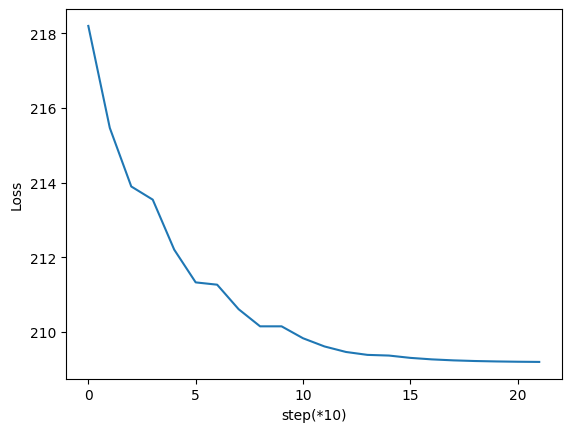

In [44]:
# 損失グラフ作成
plt.plot(loss_list['layer4.1.conv2'][60:])
plt.xlabel('step(*10)')
plt.ylabel('Loss')
plt.show()

閾値 1 を使って、永続的なプルーニングマスクを適用します。
weightの重みのゼロの数: 9408 / 9408 (100.0000%)
weightの重みのゼロの数: 36864 / 36864 (100.0000%)
weightの重みのゼロの数: 36864 / 36864 (100.0000%)
weightの重みのゼロの数: 36864 / 36864 (100.0000%)
weightの重みのゼロの数: 36864 / 36864 (100.0000%)
weightの重みのゼロの数: 73728 / 73728 (100.0000%)
weightの重みのゼロの数: 147456 / 147456 (100.0000%)
weightの重みのゼロの数: 8192 / 8192 (100.0000%)
weightの重みのゼロの数: 147456 / 147456 (100.0000%)
weightの重みのゼロの数: 147456 / 147456 (100.0000%)
weightの重みのゼロの数: 294912 / 294912 (100.0000%)
weightの重みのゼロの数: 589824 / 589824 (100.0000%)
weightの重みのゼロの数: 32768 / 32768 (100.0000%)
weightの重みのゼロの数: 589824 / 589824 (100.0000%)
weightの重みのゼロの数: 589824 / 589824 (100.0000%)
weightの重みのゼロの数: 1179648 / 1179648 (100.0000%)
weightの重みのゼロの数: 2359296 / 2359296 (100.0000%)
weightの重みのゼロの数: 131072 / 131072 (100.0000%)
weightの重みのゼロの数: 2359296 / 2359296 (100.0000%)
weightの重みのゼロの数: 2359296 / 2359296 (100.0000%)
全畳み込み層の0率：100.0000%
閾値 0.1 を使って、永続的なプルーニングマスクを適用します。
weightの重みのゼロの数: 7727 / 9408 (82.1322%)
weightの重み

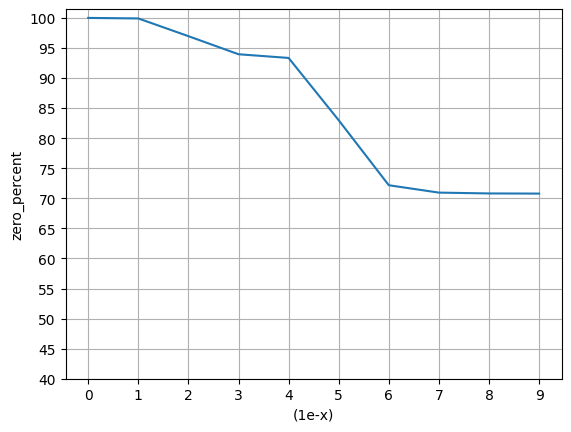

In [45]:
zero_percentage_list = []

for i in range(10):
    # 更新後の重みの値を見る
    threshold = 10**-i

    print(f"閾値 {threshold} を使って、永続的なプルーニングマスクを適用します。")

    # 2. マスクを適用したいパラメータをリストアップ
    #    ここでは、全ての畳み込み層の'weight'を対象にします。
    parameters_to_prune = [
        (module, "weight")
        for module in model.modules()
        if isinstance(module, torch.nn.Conv2d)
    ]

    # 3. 各レイヤーに対して、現在の重みを基にカスタムマスクを作成し、適用する
    for module, name in parameters_to_prune:
        # 現在の重みを取得
        weights = getattr(module, name).detach()
        
        # 閾値に基づいてマスクを作成 (絶対値が閾値より大きい要素が1、それ以外は0)
        mask = (torch.abs(weights) > threshold).float().to(weights.device)
        
        # カスタムマスクを適用
        prune.CustomFromMask.apply(module, name, mask=mask)

    with torch.no_grad():
        all_conv_params = 0
        all_conv_zeros = 0
        for module, name in parameters_to_prune:
            weight_after_pruning = module.weight
            num_zeros = (weight_after_pruning == 0).sum().item()
            total_params = weight_after_pruning.numel()
            sparsity = 100. * num_zeros / total_params

            # 全体で何％枝刈りされたか考える
            all_conv_params += total_params
            all_conv_zeros += num_zeros

            print(f"{name}の重みのゼロの数: {num_zeros} / {total_params} ({sparsity:.4f}%)")

        all_conv_sparsity = 100. * all_conv_zeros / all_conv_params
        print(f"全畳み込み層の0率：{all_conv_sparsity:.4f}%")
        zero_percentage_list.append(all_conv_sparsity)

        for module, name in parameters_to_prune:
            # 1. 元の重み('weight_orig')を退避
            original_weights = module.weight_orig.clone()

            # 2. prune.removeでフックとマスクを削除
            prune.remove(module, 'weight')

            # 3. 退避した元の重みで上書き
            module.weight.data.copy_(original_weights)

plt.plot(zero_percentage_list)
plt.xticks(range(10))
plt.yticks(np.arange(40, 101, 5))
plt.grid()
plt.xlabel('(1e-x)')
plt.ylabel('zero_percent')
plt.show()

# 0マスクをつける閾値は1e-4か1e-5くらいがよさそう

In [46]:
# maskをつくる
threshold = 1e-4   #1e-4が基準

masks = {}

for name, module in model.named_modules():
    if isinstance(module, torch.nn.Conv2d):
        # 現在の重みを取得
        weights = module.weight.detach()
        
        # 閾値に基づいてマスクを作成 (絶対値が閾値より大きい要素が1、それ以外は0)
        masks[name] = (torch.abs(weights) > threshold).float().to(weights.device)



In [47]:
# カスタムマスクを適用
# ブロックスパースアルゴリズム前の密モデルの重みに対してマスクをかける
pt_model_path = "dense.pt"
model = models.resnet18()
model.fc = nn.Linear(model.fc.in_features, 10)  # CIFAR-10 にあわせて出力層変更
model.load_state_dict(torch.load(pt_model_path))

for name, module in model.named_modules(): 
    if name in masks:
        prune.CustomFromMask.apply(module, "weight", mask=masks[name])

In [48]:
# ゼロ比率を表示
all_conv_params = 0
all_conv_zeros = 0

for name, module in model.named_modules():
  if isinstance(module, torch.nn.Conv2d):
    print(f"{name} Zero-Ratio: {100.0 * float(torch.sum(module.weight == 0)) / float(module.weight.nelement()):.4f}%")
    weight_after_pruning = module.weight
    num_zeros = (weight_after_pruning == 0).sum().item()
    total_params = weight_after_pruning.numel()
    all_conv_params += total_params
    all_conv_zeros += num_zeros

sparsity = 100. * all_conv_zeros / all_conv_params if all_conv_params > 0 else 0
print(f"全畳み込み層の0率：{sparsity:.4f}%")

conv1 Zero-Ratio: 48.5969%
layer1.0.conv1 Zero-Ratio: 69.9246%
layer1.0.conv2 Zero-Ratio: 67.2363%
layer1.1.conv1 Zero-Ratio: 65.5246%
layer1.1.conv2 Zero-Ratio: 67.2418%
layer2.0.conv1 Zero-Ratio: 70.6651%
layer2.0.conv2 Zero-Ratio: 78.7306%
layer2.0.downsample.0 Zero-Ratio: 2.1484%
layer2.1.conv1 Zero-Ratio: 77.9032%
layer2.1.conv2 Zero-Ratio: 80.3731%
layer3.0.conv1 Zero-Ratio: 82.9820%
layer3.0.conv2 Zero-Ratio: 87.2474%
layer3.0.downsample.0 Zero-Ratio: 80.8105%
layer3.1.conv1 Zero-Ratio: 90.0365%
layer3.1.conv2 Zero-Ratio: 91.7338%
layer4.0.conv1 Zero-Ratio: 92.5602%
layer4.0.conv2 Zero-Ratio: 95.4720%
layer4.0.downsample.0 Zero-Ratio: 91.7564%
layer4.1.conv1 Zero-Ratio: 94.7792%
layer4.1.conv2 Zero-Ratio: 99.9841%
全畳み込み層の0率：93.3421%


In [ ]:
# 再訓練
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = 0.001)   #lr = 0.001で損失0.02とか
num_epochs = 15
epoch_loss_list = []
# CosineAnnealingLRを定義
# T_max: 学習率が半周期で最小値になるまでのエポック数。通常、総エポック数を指定。
# eta_min: 最小学習率。
scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

for epoch in range(num_epochs):
  model.train()
  model = model.to(device)
  total_loss = 0.0
  num_train = 0
  for inputs, labels in trainloader:
    inputs, labels = inputs.to(device), labels.to(device)   # データ代入

    # 重み更新のための手順
    optimizer.zero_grad()
    outputs = model(inputs)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()

    # 損失を記録
    total_loss += loss.item()*labels.size(0)
    num_train+=labels.size(0)

  # 出力と記録
  epoch_loss_list.append(total_loss/num_train)
  current_lr = optimizer.param_groups[0]['lr']
  print(f'Epoch[{epoch+1}/{num_epochs}], Loss: {epoch_loss_list[epoch]:.4f}, LR: {current_lr:.8f}')


  # 次のエポックへの準備
  if epoch >= 1:
    if np.abs(epoch_loss_list[epoch]-epoch_loss_list[epoch-1]) < 0.001:
      break
  scheduler.step()

Epoch[1/10], Loss: 0.7689, LR: 0.01000000
Epoch[2/10], Loss: 0.3943, LR: 0.00975528
Epoch[3/10], Loss: 0.2734, LR: 0.00904508
Epoch[4/10], Loss: 0.1862, LR: 0.00793893
Epoch[5/10], Loss: 0.1165, LR: 0.00654508
Epoch[6/10], Loss: 0.0572, LR: 0.00500000
Epoch[7/10], Loss: 0.0179, LR: 0.00345492
Epoch[8/10], Loss: 0.0044, LR: 0.00206107
Epoch[9/10], Loss: 0.0023, LR: 0.00095492
Epoch[10/10], Loss: 0.0020, LR: 0.00024472


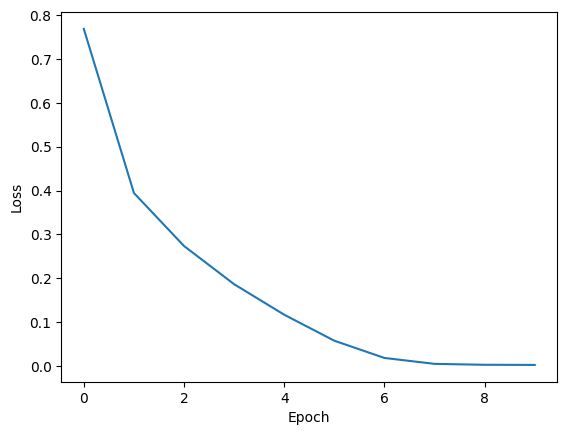

In [88]:
# 損失グラフ作成
plt.plot(epoch_loss_list)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

In [89]:
# 永続化（マスクと重みを掛ける）
for module in model.modules():
  if isinstance(module, torch.nn.Conv2d):
    prune.remove(module, "weight")

In [90]:
# onnxファイルとptファイルの作成
model = model.to('cpu')
model_to_onnx(model, "blocksparse_trained2.onnx")
torch.save(model.state_dict(), "blocksparse_trained2.pt")

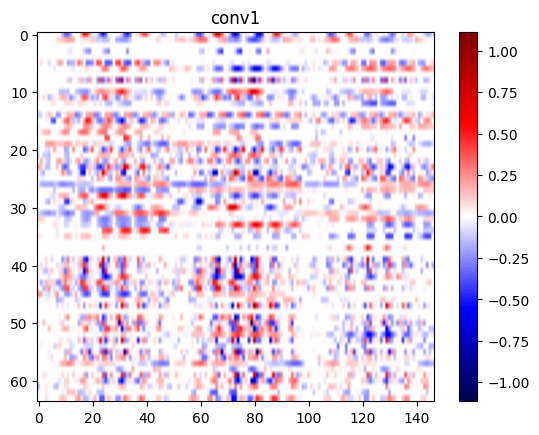

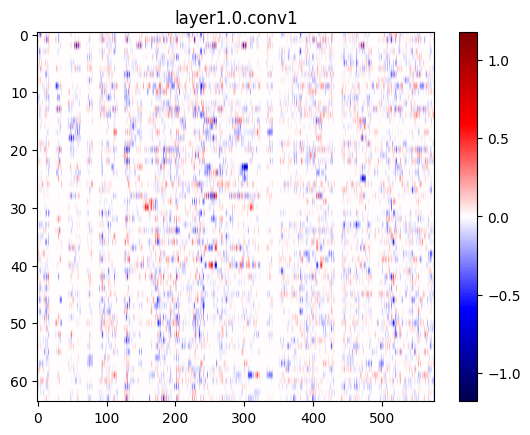

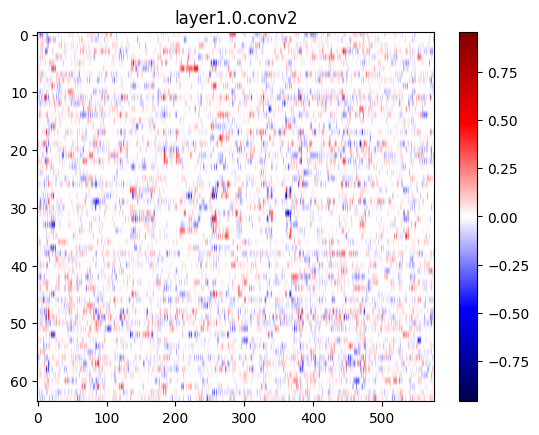

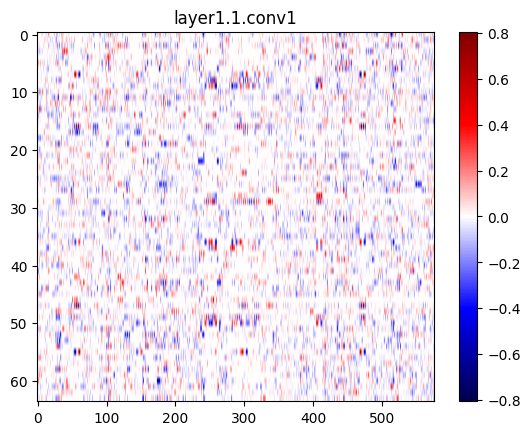

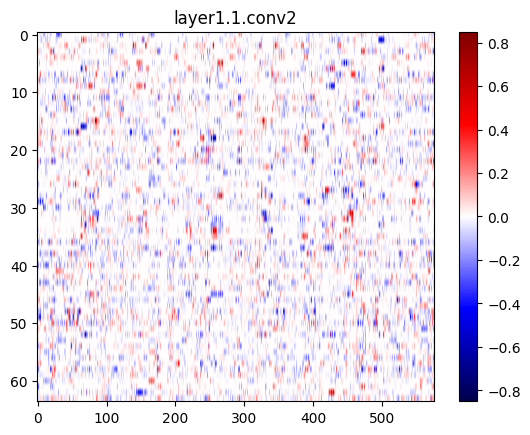

...

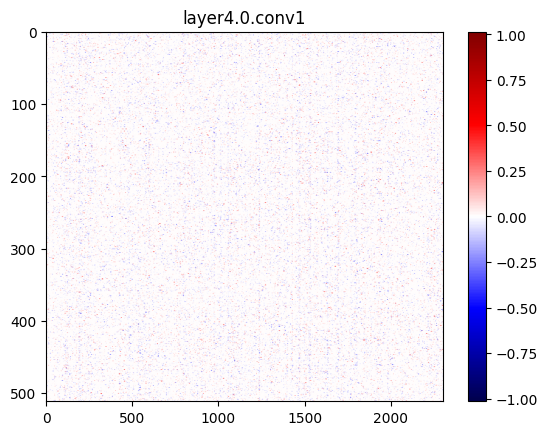

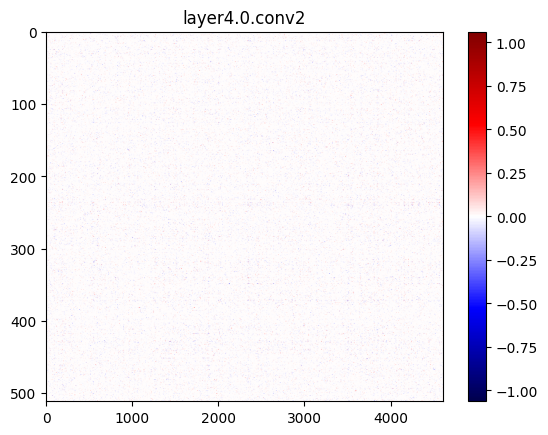

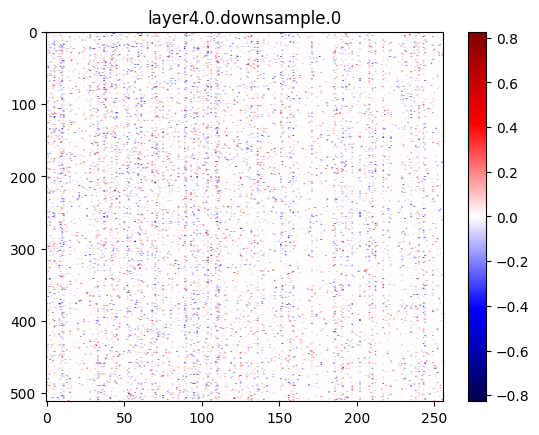

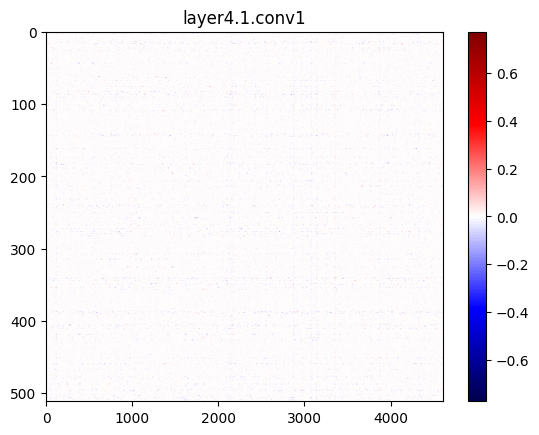

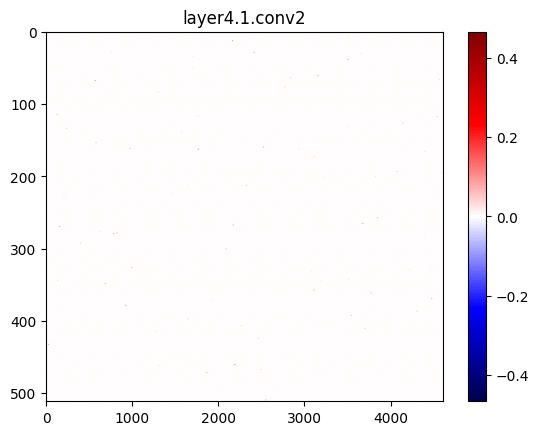

In [ ]:
# 2. モデルの全てのモジュールを名前付きでループ
for name, module in model.named_modules():

    # 3. モジュールが畳み込み層(nn.Conv2d)かどうかを判定
    if isinstance(module, nn.Conv2d):
        conv_weight = module.weight.data
        w_2d = conv_weight.view(conv_weight.size(0), -1).numpy()  # shape: [64, 3×7×7=147]

        # データの絶対値の最大値を取得
        vmax = np.abs(w_2d).max()
        plt.imshow(w_2d, cmap='seismic', aspect='auto', vmin = -vmax, vmax = vmax)
        plt.colorbar()
        plt.title(name)
        plt.show()
        


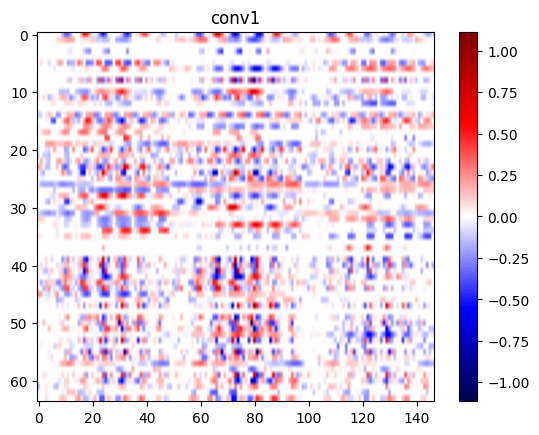

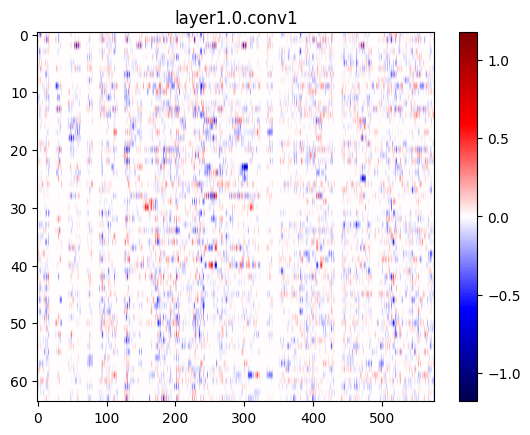

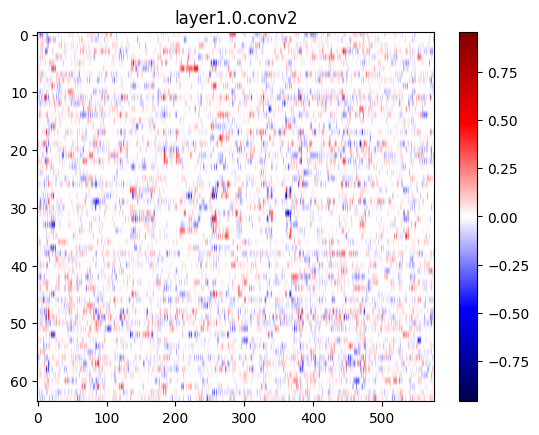

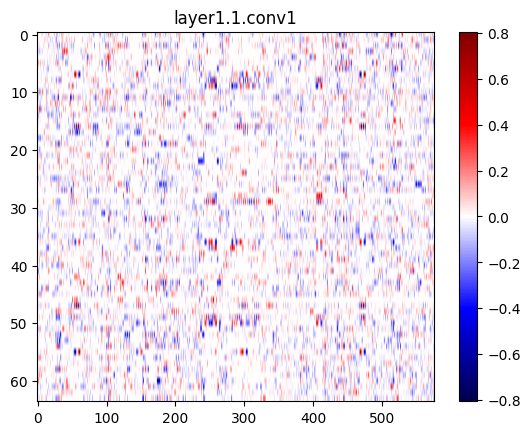

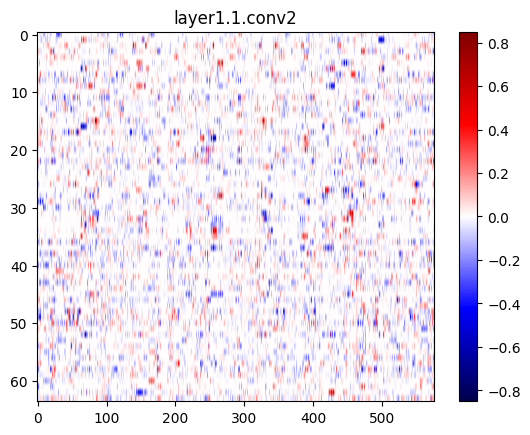

...

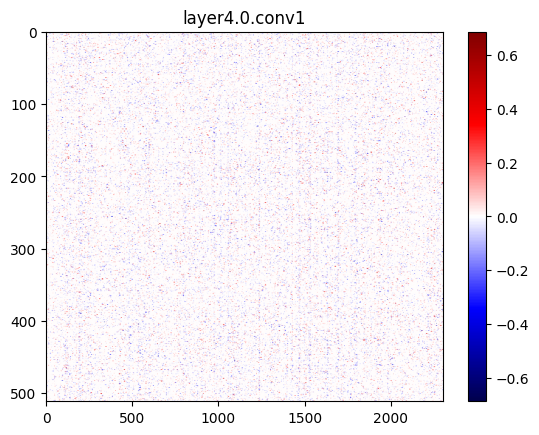

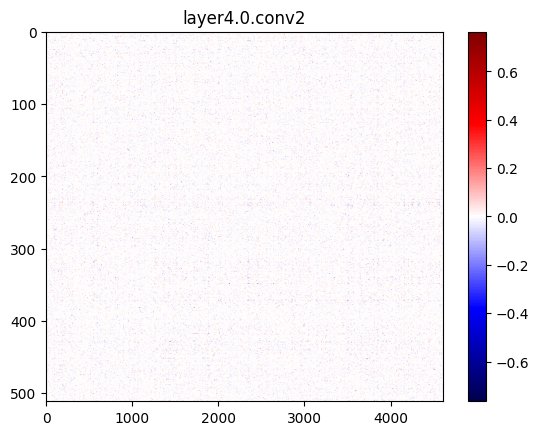

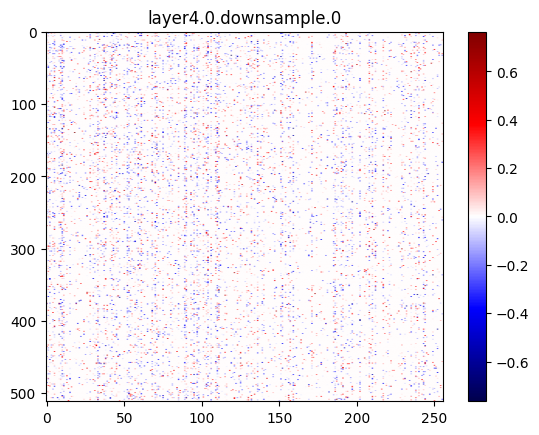

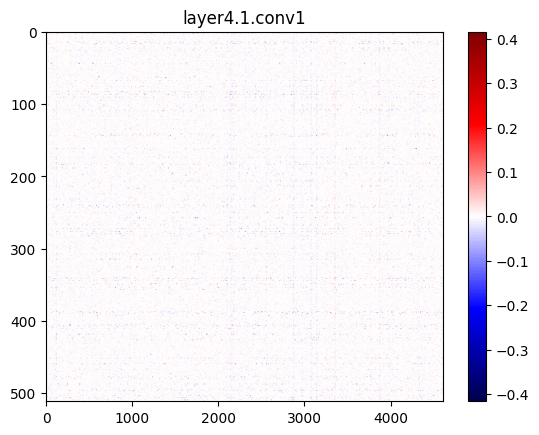

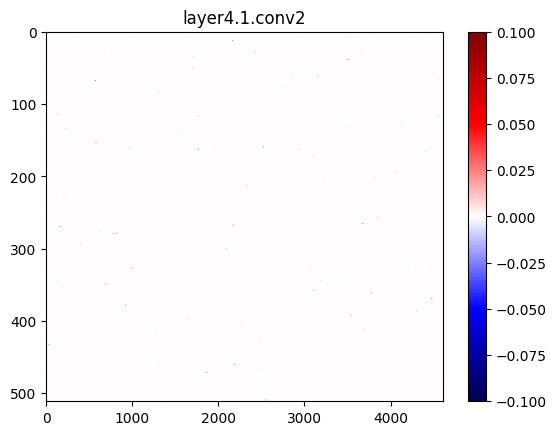

In [92]:
# 2. モデルの全てのモジュールを名前付きでループ
for name, module in model.named_modules():

    # 3. モジュールが畳み込み層(nn.Conv2d)かどうかを判定
    if isinstance(module, nn.Conv2d):
        conv_weight = module.weight.data
        w_2d = conv_weight.view(conv_weight.size(0), -1).numpy()  # shape: [64, 3×7×7=147]

        # データの絶対値の最大値を取得
        vmax = np.abs(w_2d[:64, :147]).max()
        plt.imshow(w_2d, cmap='seismic', aspect='auto', vmin = -vmax, vmax = vmax)
        plt.colorbar()
        plt.title(name)
        plt.show()
        
